In [1]:
#Import libraries
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set()
import tensorflow as tf
from sklearn.datasets import load_files       
from glob import glob
from tqdm import tqdm
import GPUtil

In [5]:
# define function to load train, test, and validation datasets
def load_dataset(path):
    data = load_files(path)
    files = np.array(data['filenames'])
    targets = tf.keras.utils.to_categorical(np.array(data['target']), 3)
    return files, targets

# load train, test, and validation datasets
X_train, y_train = load_dataset('data/train')
X_valid, y_valid = load_dataset('data/valid')
X_test, y_test = load_dataset('data/test')

# load ordered list
anomaly_type = [item[:-1] for item in glob('data/train/*/')]

# print statistics about the dataset
print('There are %d total anomaly categories.' % len(anomaly_type))
print('There are %s total anomaly images.\n' % str(len(X_train) + len(X_valid) + len(X_test)))
print('There are %d training anomaly images.' % len(X_train))
print('There are %d validation anomaly images.' % len(X_valid))
print('There are %d test anomaly images.'% len(X_test))

There are 3 total anomaly categories.
There are 2750 total anomaly images.

There are 2000 training anomaly images.
There are 150 validation anomaly images.
There are 600 test anomaly images.


In [6]:
#define function to show images
def visualize_img(img_path, ax):
    img = cv2.imread(img_path)
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

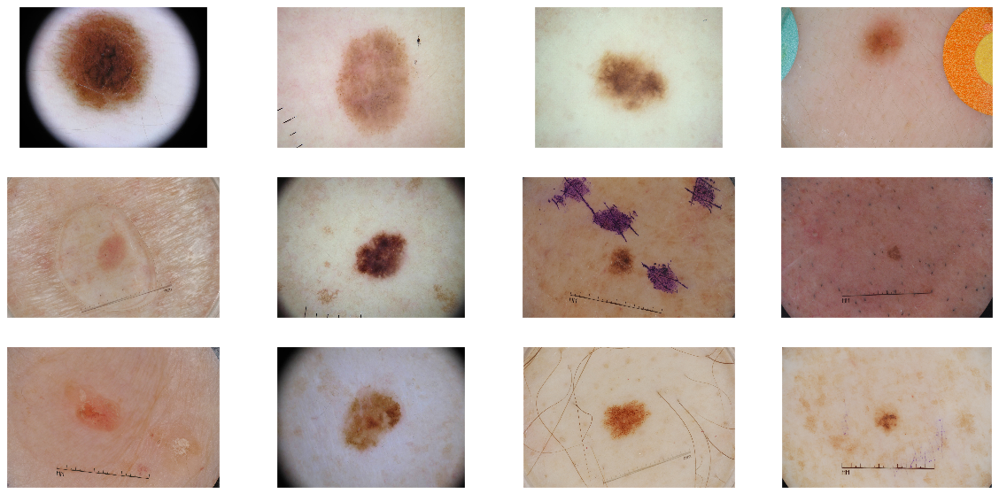

In [4]:
#Load some images
fig = plt.figure(figsize=(20, 10))
for i in range(12):
    ax = fig.add_subplot(3, 4, i + 1, xticks=[], yticks=[])
    visualize_img(X_train[i], ax)

In [7]:
#define functions to transform images into tensors
def path_to_tensor(img_path):
    # loads RGB image as PIL.Image.Image type
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=(299, 299))
    # convert PIL.Image.Image type to 3D tensor with shape (299, 299, 3)
    x = tf.keras.preprocessing.image.img_to_array(img)
    # convert 3D tensor to 4D tensor with shape (1, 299, 299, 3) and return 4D tensor
    return np.expand_dims(x, axis=0)

def paths_to_tensor(img_paths):
    list_of_tensors = [path_to_tensor(img_path) for img_path in tqdm(img_paths)]
    return np.vstack(list_of_tensors)

In [8]:
#load images into memory 
#train and test sets
train_tensors = paths_to_tensor(X_train).astype('float32')
valid_tensors = paths_to_tensor(X_valid).astype('float32')

100%|████████████████████████████████████████████████████████████████████████████████| 150/150 [00:27<00:00,  5.38it/s]


In [9]:
#define batch size
batch_size = 64

In [10]:
#define Image Generator for training set
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255,
                                                                horizontal_flip=True,
                                                                vertical_flip=True,
                                                                rotation_range=90,
                                                                width_shift_range=0.1,
                                                                height_shift_range=0.1,
                                                                shear_range=0.1,
                                                                zoom_range=[0.2,1.])

train_generator = train_datagen.flow(x = train_tensors, y = y_train,
                                     batch_size=batch_size)

In [11]:
#define Image Generator for validation and test sets
test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)

In [12]:
validation_generator = test_datagen.flow(x = valid_tensors, y = y_valid,
                                         batch_size=batch_size,
                                         shuffle=False)

In [13]:
#define the pre-trained model GOOGLE InceptionV3
model = tf.keras.applications.inception_v3.InceptionV3(weights= None, include_top=True, classes= 3, input_shape= (299, 299, 3))


In [14]:
#define model compile
custom_optimizer = tf.keras.optimizers.RMSprop(epsilon=0.1, momentum=0.9, decay=0.9)
model.compile(optimizer= custom_optimizer, loss='categorical_crossentropy', metrics=[tf.keras.metrics.AUC()])

In [15]:
#define callbacks
#learing rate control
learning_rate_reduction = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                                                               patience=15, 
                                                               verbose=1, 
                                                               factor=0.2, 
                                                               min_lr=0.0001)
#control overfitting with early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(patience=25)

#save the best model 
checkpointer = tf.keras.callbacks.ModelCheckpoint(filepath='saved_models/weights.hdf5', 
                               verbose=1, save_best_only=True)

In [16]:
#dealing with unbalanced dataset
from collections import Counter

#counting number of classes
classes_count = np.array([np.argmax(target) for target in y_train])

#counting number of elements in each class
counter = {}
keys, values = np.unique(classes_count, return_counts=True)
for n, key in enumerate(keys):
    counter[key] = values[n]

#identifying the dominant class
max_val = float(max(counter.values()))       

#defining classes weights
class_weights = {class_id : max_val/num_images for class_id, num_images in counter.items()}

#defining batches step sizes
STEP_SIZE_TRAIN=train_generator.n//train_generator.batch_size
STEP_SIZE_VALID=validation_generator.n//validation_generator.batch_size

In [17]:
tf.keras.backend.clear_session()

In [18]:
#model training

#define number of epochs
epochs = 300

#fitting and training the model 
model.fit_generator(train_generator,
                    steps_per_epoch=STEP_SIZE_TRAIN,
                    epochs=epochs,
                    class_weight=class_weights,
                    validation_data= validation_generator,
                    validation_steps=STEP_SIZE_VALID,
                    verbose=2,                
                    callbacks=[checkpointer, learning_rate_reduction, early_stopping])

Epoch 1/300

Epoch 00001: val_loss improved from inf to 1.08702, saving model to saved_models/weights.hdf5
31/31 - 32s - loss: 2.5282 - auc: 0.5495 - val_loss: 1.0870 - val_auc: 0.6443
Epoch 2/300

Epoch 00002: val_loss did not improve from 1.08702
31/31 - 31s - loss: 2.3260 - auc: 0.6151 - val_loss: 1.1082 - val_auc: 0.5359
Epoch 3/300

Epoch 00003: val_loss did not improve from 1.08702
31/31 - 31s - loss: 2.1589 - auc: 0.6011 - val_loss: 1.1297 - val_auc: 0.5365
Epoch 4/300

Epoch 00004: val_loss did not improve from 1.08702
31/31 - 30s - loss: 2.1269 - auc: 0.6393 - val_loss: 1.1499 - val_auc: 0.4992
Epoch 5/300

Epoch 00005: val_loss did not improve from 1.08702
31/31 - 30s - loss: 2.1083 - auc: 0.6462 - val_loss: 1.1794 - val_auc: 0.4399
Epoch 6/300

Epoch 00006: val_loss did not improve from 1.08702
31/31 - 30s - loss: 2.0516 - auc: 0.6730 - val_loss: 1.2136 - val_auc: 0.3941
Epoch 7/300

Epoch 00007: val_loss did not improve from 1.08702
31/31 - 31s - loss: 2.1181 - auc: 0.6497 

Epoch 00050: val_loss did not improve from 0.94096
31/31 - 31s - loss: 2.0626 - auc: 0.6773 - val_loss: 0.9524 - val_auc: 0.7429
Epoch 51/300

Epoch 00051: val_loss did not improve from 0.94096
31/31 - 31s - loss: 2.0764 - auc: 0.6803 - val_loss: 0.9497 - val_auc: 0.7467
Epoch 52/300

Epoch 00052: val_loss did not improve from 0.94096
31/31 - 32s - loss: 2.0335 - auc: 0.6929 - val_loss: 0.9478 - val_auc: 0.7481
Epoch 53/300

Epoch 00053: val_loss did not improve from 0.94096
31/31 - 32s - loss: 1.9689 - auc: 0.6907 - val_loss: 0.9452 - val_auc: 0.7503
Epoch 54/300

Epoch 00054: val_loss did not improve from 0.94096
31/31 - 31s - loss: 2.0513 - auc: 0.6752 - val_loss: 0.9492 - val_auc: 0.7434
Epoch 55/300

Epoch 00055: val_loss did not improve from 0.94096
31/31 - 32s - loss: 2.0214 - auc: 0.6965 - val_loss: 0.9497 - val_auc: 0.7444
Epoch 56/300

Epoch 00056: val_loss did not improve from 0.94096
31/31 - 31s - loss: 2.0377 - auc: 0.6817 - val_loss: 0.9476 - val_auc: 0.7449
Epoch 57/300


Epoch 00105: val_loss did not improve from 0.92982
31/31 - 32s - loss: 1.9772 - auc: 0.7029 - val_loss: 0.9345 - val_auc: 0.7548
Epoch 106/300

Epoch 00106: val_loss did not improve from 0.92982
31/31 - 30s - loss: 1.9993 - auc: 0.6876 - val_loss: 0.9358 - val_auc: 0.7538
Epoch 107/300

Epoch 00107: val_loss did not improve from 0.92982
31/31 - 31s - loss: 2.0298 - auc: 0.6981 - val_loss: 0.9325 - val_auc: 0.7565
Epoch 108/300

Epoch 00108: val_loss did not improve from 0.92982
31/31 - 31s - loss: 2.0121 - auc: 0.6923 - val_loss: 0.9349 - val_auc: 0.7542
Epoch 109/300

Epoch 00109: val_loss did not improve from 0.92982
31/31 - 31s - loss: 1.9600 - auc: 0.7004 - val_loss: 0.9345 - val_auc: 0.7573
Epoch 110/300

Epoch 00110: val_loss did not improve from 0.92982
31/31 - 31s - loss: 2.0211 - auc: 0.7020 - val_loss: 0.9324 - val_auc: 0.7591
Epoch 111/300

Epoch 00111: val_loss did not improve from 0.92982
31/31 - 31s - loss: 1.9725 - auc: 0.6944 - val_loss: 0.9330 - val_auc: 0.7579
Epoch 1

KeyboardInterrupt: 

In [19]:
#test set
test_tensors = paths_to_tensor(X_test).astype('float32')

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 600/600 [02:54<00:00,  3.44it/s]


In [20]:
test_generator = test_datagen.flow(x = test_tensors, y = y_test,
                                   shuffle=False)

In [21]:
#loading model weights
model.load_weights('saved_models/weights.hdf5')

In [22]:
#making predictions
predictions = model.predict(test_generator, verbose = 1)

#transforming targets and prediction into numpy array
preds = np.array(np.argmax(predictions, axis = 1))
targets = np.array(np.argmax(y_test, axis = 1))

19/19 [==============================] - ETA: 31 - ETA: 15 - ETA: 10 - ETA: 7 - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - 4s 221ms/step


In [23]:
#printing confusion matrix
from sklearn.metrics import confusion_matrix 
print(confusion_matrix(targets, preds))

[[ 43  21  53]
 [125 143 125]
 [ 10  16  64]]


In [24]:
from sklearn.metrics import classification_report
y_true = targets
y_pred = preds
target_names = ['Melanoma', 'Nevus', 'Seborrheic Keratosis']
print(classification_report(y_true, y_pred, target_names=target_names))


                      precision    recall  f1-score   support

            Melanoma       0.24      0.37      0.29       117
               Nevus       0.79      0.36      0.50       393
Seborrheic Keratosis       0.26      0.71      0.39        90

            accuracy                           0.42       600
           macro avg       0.43      0.48      0.39       600
        weighted avg       0.61      0.42      0.44       600



In [26]:
#joing targets and predictions into one array
newarr = np.append(arr = np.round(predictions, 3), values = targets.reshape(600,1), axis = 1)

In [27]:
#creating a data frame
df = pd.DataFrame(newarr)

In [28]:
#basic statistics
df.describe()

,0,1,2,3
count,600.000000,600.000000,600.000000,600.000000
mean,0.130973,0.484147,0.384828,0.955000
std,0.189847,0.352599,0.369269,0.586129
min,0.000000,0.003000,0.000000,0.000000
25%,0.008000,0.127000,0.016000,1.000000
50%,0.052000,0.452500,0.258000,1.000000
75%,0.170500,0.857250,0.765500,1.000000
max,0.971000,0.995000,0.979000,2.000000


In [29]:
#filtering melanona
melanoma = df[(df[3]==0)]

#melanona basic statistics
melanoma.describe()

,0,1,2,3
count,117.000000,117.000000,117.000000,117.0
mean,0.188658,0.354513,0.456786,0.0
std,0.234413,0.306986,0.340205,0.0
min,0.000000,0.004000,0.000000,0.0
25%,0.023000,0.107000,0.081000,0.0
50%,0.107000,0.221000,0.481000,0.0
75%,0.285000,0.561000,0.776000,0.0
max,0.952000,0.984000,0.962000,0.0


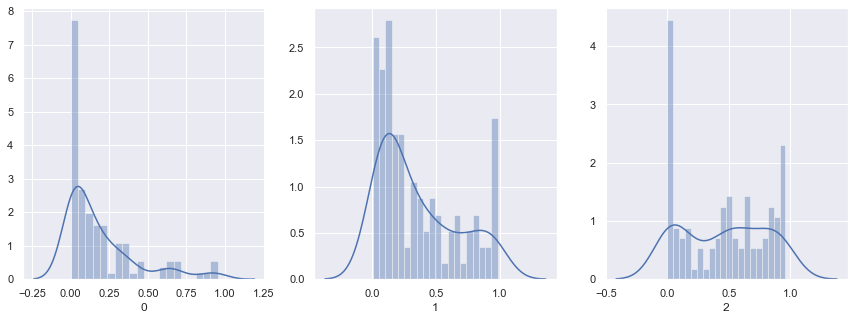

In [30]:
#distplot melanoma
plt.figure(figsize=(20, 5))
for i, col in enumerate(df.columns[:3]):
    plt.subplot(1, 4, i + 1)
    plt.subplots_adjust(wspace = 0.2, hspace = 0.4)
    sns.distplot(melanoma[col],20)

In [31]:
#filtering postive melanonas
pos_melanoma = df[(df[3]==0) & (df.drop(3, axis = 1).idxmax(axis=1)==0)]

#melanona basic statistics
pos_melanoma.describe()

,0,1,2,3
count,13.000000,13.000000,13.000000,13.0
mean,0.747462,0.187846,0.064692,0.0
std,0.142038,0.120923,0.090039,0.0
min,0.592000,0.020000,0.000000,0.0
25%,0.629000,0.104000,0.002000,0.0
50%,0.686000,0.186000,0.026000,0.0
75%,0.895000,0.313000,0.100000,0.0
max,0.952000,0.371000,0.272000,0.0


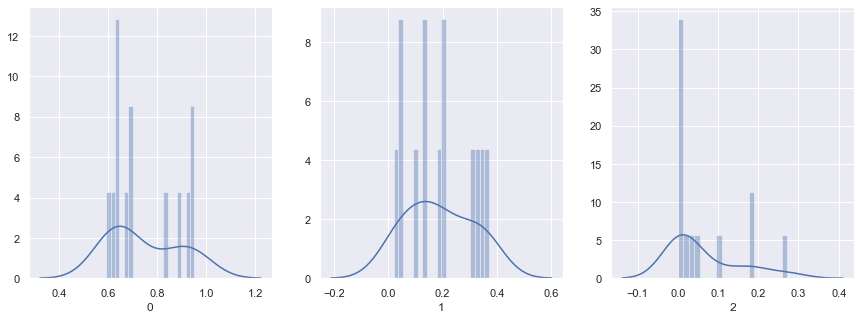

In [32]:
#distplot pos_melanoma
plt.figure(figsize=(20, 5))
for i, col in enumerate(df.columns[:3]):
    plt.subplot(1, 4, i + 1)
    plt.subplots_adjust(wspace = 0.2, hspace = 0.4)
    sns.distplot(pos_melanoma[col],20)

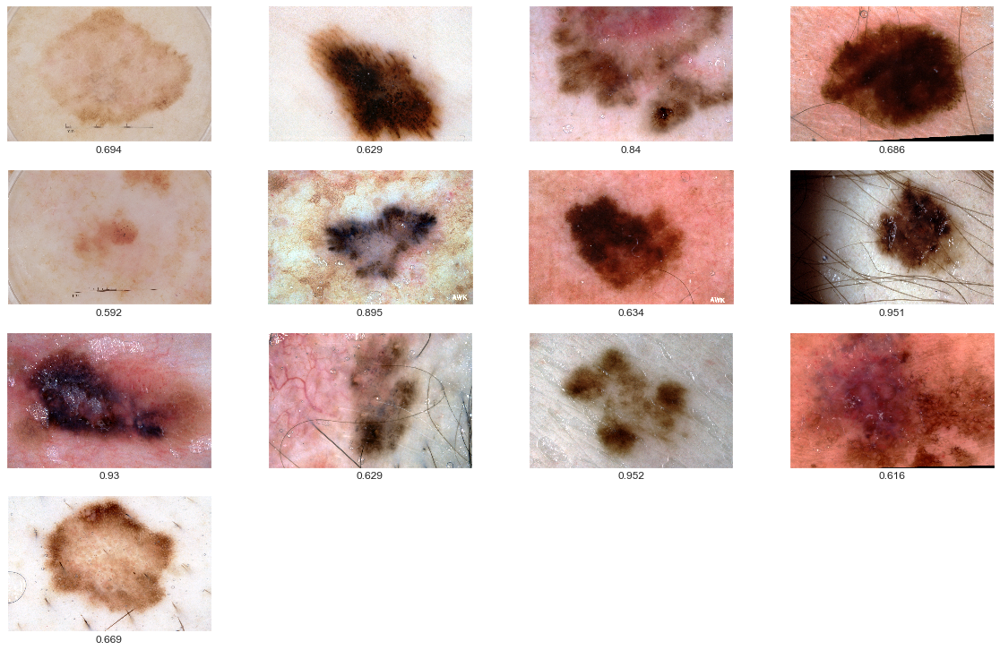

In [33]:
#ploting all positive for melanoma
fig = plt.figure(figsize=(20, 100))
for n, i in enumerate(pos_melanoma.index):
    ax = fig.add_subplot(30, 4, n + 1, xticks=[], yticks=[])
    plt.xlabel(round(pos_melanoma[0][i],3))
    visualize_img(X_test[i], ax)

In [34]:
#Nevus
nevus = df[(df[3]==1)]

#basic statistics
nevus.describe()

,0,1,2,3
count,393.000000,393.000000,393.000000,393.0
mean,0.136473,0.583214,0.280257,1.0
std,0.183953,0.336885,0.331058,0.0
min,0.000000,0.003000,0.000000,1.0
25%,0.016000,0.242000,0.006000,1.0
50%,0.066000,0.663000,0.098000,1.0
75%,0.177000,0.909000,0.569000,1.0
max,0.971000,0.995000,0.978000,1.0


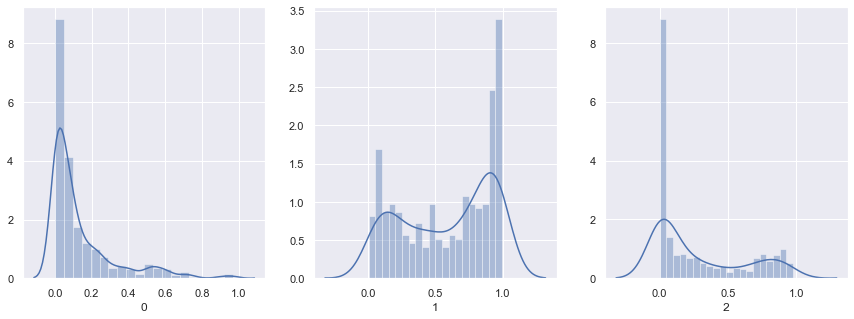

In [35]:
plt.figure(figsize=(20, 5))
for i, col in enumerate(df.columns[:3]):
    plt.subplot(1, 4, i + 1)
    plt.subplots_adjust(wspace = 0.2, hspace = 0.4)
    sns.distplot(nevus[col],20)

In [36]:
#Positive for Nevus
pos_nevus = df[(df[3]==1) & (df.drop(3, axis = 1).idxmax(axis=1)==1)]

#basic statistics
pos_nevus.describe()

,0,1,2,3
count,243.000000,243.000000,243.000000,243.0
mean,0.095041,0.819807,0.085132,1.0
std,0.104237,0.159945,0.120702,0.0
min,0.000000,0.374000,0.000000,1.0
25%,0.015000,0.723500,0.002000,1.0
50%,0.058000,0.878000,0.019000,1.0
75%,0.134500,0.952500,0.139000,1.0
max,0.468000,0.995000,0.476000,1.0


In [37]:
#Seborrheic Keratosis
seborrheic_keratosis = df[(df[3]==2)]

#basic statistics
seborrheic_keratosis.describe()

,0,1,2,3
count,90.000000,90.000000,90.000000,90.0
mean,0.031967,0.220078,0.747911,2.0
std,0.086558,0.279478,0.309455,0.0
min,0.000000,0.013000,0.000000,2.0
25%,0.000000,0.037000,0.648250,2.0
50%,0.002000,0.067000,0.921500,2.0
75%,0.017500,0.302500,0.959750,2.0
max,0.570000,0.984000,0.979000,2.0


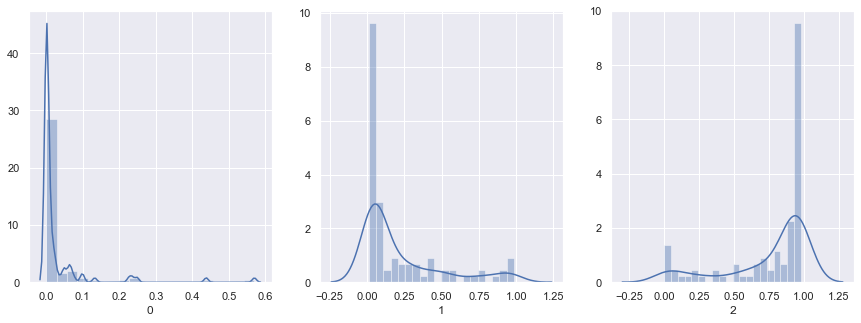

In [38]:
plt.figure(figsize=(20, 5))
for i, col in enumerate(df.columns[:3]):
    plt.subplot(1, 4, i + 1)
    plt.subplots_adjust(wspace = 0.2, hspace = 0.4)
    sns.distplot(seborrheic_keratosis[col],20)

In [39]:
#Positive for Nevus
pos_seborrheic = df[(df[3]==2) & (df.drop(3, axis = 1).idxmax(axis=1)==2)]

#basic statistics
pos_seborrheic.describe()

,0,1,2,3
count,74.000000,74.000000,74.000000,74.0
mean,0.014959,0.107000,0.877973,2.0
std,0.036229,0.114655,0.126545,0.0
min,0.000000,0.013000,0.515000,2.0
25%,0.000000,0.035250,0.832750,2.0
50%,0.001000,0.053500,0.940500,2.0
75%,0.006750,0.120750,0.963000,2.0
max,0.227000,0.449000,0.979000,2.0


In [40]:
#False Negative for Melanoma
neg_melanoma = df[(df[3]==0) & (df.drop(3, axis = 1).idxmax(axis=1)!=0)]

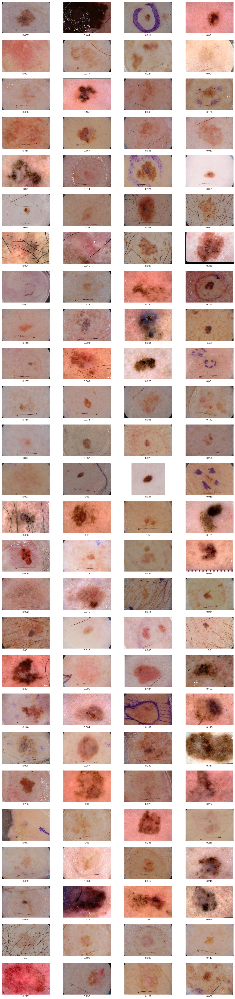

In [41]:
fig = plt.figure(figsize=(20, 100))
for n, i in enumerate(neg_melanoma.index):
    ax = fig.add_subplot(30, 4, n + 1, xticks=[], yticks=[])
    plt.xlabel(round(neg_melanoma[0][i],3))
    visualize_img(X_test[i], ax)

In [42]:
#Using 20% probability for threshold
melanoma_threshold = df[(df[0]>=0.2)]
people_for_testing = melanoma_threshold[0].count()
print('You need to send {} people for melanoma testing.'.format(people_for_testing))

You need to send 129 people for melanoma testing.


In [43]:
melanoma_threshold = df[(df[0]>=0.2) & (df[3]==0)]
correct = melanoma_threshold[0].count()
print('You have correctly detected {} cases.'.format(correct))

You have correctly detected 37 cases.


In [44]:
#Recall Score at threshold 20%
print('Recall Score =', round(correct/117,3))

Recall Score = 0.316


In [45]:
#Precision Score at threshold 20%
print('Precision Score', round(correct/people_for_testing,3))

Precision Score 0.287
